# Context:
Can you differentiate a weed from a crop seedling?
The ability to do so effectively can mean better crop yields and better stewardship of the environment.
The Aarhus University Signal Processing group, in collaboration with University of Southern Denmark, has
recently released a dataset containing images of unique plants belonging to 12 species at several growth stages

### Data Description:
You are provided with a dataset of images of plant seedlings at various stages of grown. Each image has a filename that is its unique id. The dataset comprises 12 plant species. The goal of the project is to create a classifier capable of determining a plant's species from a photo.

### Dataset:
The dataset can be download from Olympus.
The data file names are:
* images.npy
* Label.csv



#### Setup
Let's begin by setting random seeds and importing libraries.

In [5]:
## This entire cell is an attempt to get reproducible results from Keras.
## It works... some of the time... if the GPU is not used.

# Seed value
seed_value= 0

# 1. Set the `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)

# 2. Set the `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)

# 3. Set the `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)

# 4. Set the `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.random.set_seed(seed_value)
# for later versions: 
# tf.compat.v1.set_random_seed(seed_value)

# 5. Configure a new global `tensorflow` session
from keras import backend as K
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

In [6]:
# Import necessary libraries

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# essential libraries to handle data
import numpy as np
import pandas as pd

# plotting
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
from google.colab.patches import cv2_imshow

# data preparation
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import classification_report, confusion_matrix

# CNN libraries
from tensorflow.keras.models import Sequential          # Sequential groups a linear stack of layers into a tf.keras.Model.
from tensorflow.keras.layers import Conv2D              # This layer creates a convolution kernel that is convolved with the layer input to produce a tensor of outputs.
from tensorflow.keras.layers import MaxPooling2D        # Max pooling operation for 2D spatial data.
from tensorflow.keras.layers import Flatten             # Flattens the input. Does not affect the batch size.
from tensorflow.keras.layers import Dense, Dropout      # Dropout: Applies Dropout to the input.
                                                        # Dense: Just your regular densely-connected NN layer.




# Load dataset and Summary
*- Read the dataset properly -Print the overview of the data (shape, checking the proportion of each class) - Plot the images from each class and print their corresponding labels.*

## Data Read - Labels
First we will load in the labels and take a look at them

In [7]:
# Mount Google drive so dataset can be accessed (The dataset file (monkeys_dataset.zip) is inside google drive.)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
# We will load the labels into a Pandas data frame for ease of use. We will convert it to an array later.
labels = pd.read_csv('/content/drive/My Drive/AIML Course/Intro to Computer Vision/Project/Labels.csv')

In [9]:
labels

,Label
0,Small-flowered Cranesbill
1,Small-flowered Cranesbill
2,Small-flowered Cranesbill
3,Small-flowered Cranesbill
4,Small-flowered Cranesbill
...,...
4745,Loose Silky-bent
4746,Loose Silky-bent
4747,Loose Silky-bent
4748,Loose Silky-bent


* The labels data have a shape of 4750 rows and 1 column. 
* We can see that the labels are currently strings, we will need to encode these values later, in order use the labels in our modelling.
* The labels are in some sort of order, i.e. all the "Small-flowered Cranesbill" are listed first, all the "Loose Silky-bent" are listed last.

In [10]:
# Check for null values in the labels
labels.isnull().sum()

Label    0
dtype: int64

* There are no null values in the labels

In [11]:
# Check the number of classes in the labels
labels.nunique()

Label    12
dtype: int64

* There are 12 different classes, i.e. 12 different seedling types in the data. This matches our expectation from the data description


Now let's look at the distribution of the different seedlings in the data set:

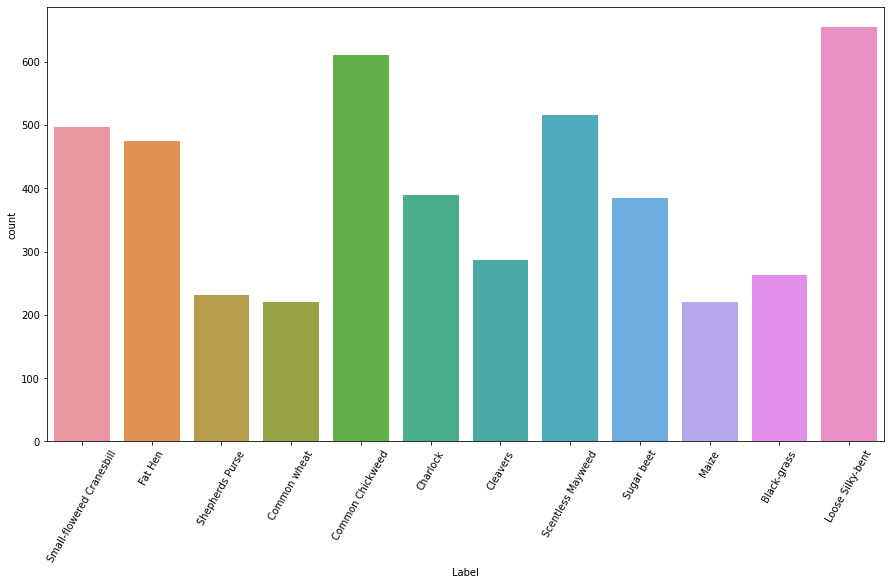

In [12]:
plt.figure(figsize = (15,8))
sns.countplot(data=labels, x='Label')
plt.xticks(rotation=60)
plt.show()

* We can see from the plot above that the different classes are not balanced. We will need to keep this in mind when we split the data into train, validation and test sets.

Let's look at the proportions of each class below:

In [13]:
labels.value_counts()

Label                    
Loose Silky-bent             654
Common Chickweed             611
Scentless Mayweed            516
Small-flowered Cranesbill    496
Fat Hen                      475
Charlock                     390
Sugar beet                   385
Cleavers                     287
Black-grass                  263
Shepherds Purse              231
Maize                        221
Common wheat                 221
dtype: int64

In [14]:
proportions = (labels.value_counts() / 4750)*100
proportions

Label                    
Loose Silky-bent             13.768421
Common Chickweed             12.863158
Scentless Mayweed            10.863158
Small-flowered Cranesbill    10.442105
Fat Hen                      10.000000
Charlock                      8.210526
Sugar beet                    8.105263
Cleavers                      6.042105
Black-grass                   5.536842
Shepherds Purse               4.863158
Maize                         4.652632
Common wheat                  4.652632
dtype: float64

We can see that the most common seedling type in the data is Loose Silk-bent (13.8% of data) and the least common seedling types are Common wheat and Maize (4.7% of data each).

## Data Read - Images

In [15]:
images = np.load('/content/drive/My Drive/AIML Course/Intro to Computer Vision/Project/images.npy')

In [16]:
images.shape

(4750, 128, 128, 3)

* The images are currently stored as a tensor with shape (4750, 128, 128, 3)
* There are 4750 images in the data, this number matches the number of labels that we have.
* Each image is 128 x 128 pixels in size.
* Each image has 3 sets of pixel intensity, one for red, blue and green.

In [17]:
images[1].shape

(128, 128, 3)

* Above we can see the shape of a single image 128 x 128 pixels with the 3 (RGB) channels.
* The picture below shows the a single image from the data

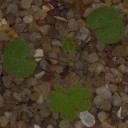

In [18]:
cv2_imshow(images[1])

The following commands will check various aspects of the numpy array.

In [19]:
# Check for null values in the images tensor
np.isnan(np.sum(images))

False

In [20]:
# Check the max value of the images tensor
images.max()

255

In [21]:
# Check the min value of the images tensor
images.min()

0

In [22]:
# Finally the data type
images.dtype

dtype('uint8')

* There are no null values in the images tensor.
* The max value is 255 and the min value is 0 - this conforms to our expectation of digial image data
* The data type is uint8 i.e. 8-bit unsigned integer (0 to 255). Again this confirms that we are looking at images and that the data have loaded correctly.

## Plot Sample Images
The scoring rubric says "Plot the images from each class and print their corresponding labels". Given that there are 4750 images, I'm going to assume that the task is not to plot every image. I will instead plot the first image of each class in the data. 

In [23]:
# This command will show us the first instance of the named seedling in the database, we can then read the index
labels[labels['Label']=='Small-flowered Cranesbill'].head(1)

,Label
0,Small-flowered Cranesbill


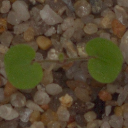

Small-flowered Cranesbill


In [24]:
cv2_imshow(images[0])
print(labels.iloc[0,0])

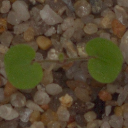

Small-flowered Cranesbill


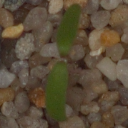

Fat Hen


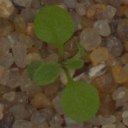

Shepherds Purse


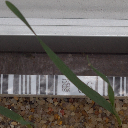

Common wheat


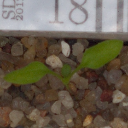

Common Chickweed


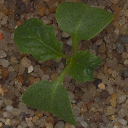

Charlock


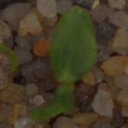

Cleavers


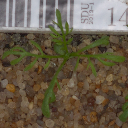

Scentless Mayweed


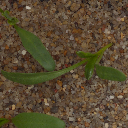

Sugar beet


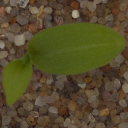

Maize


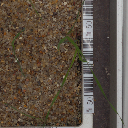

Black-grass


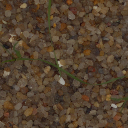

Loose Silky-bent


In [25]:
# Rather than repeat the above two cells for each seedling type, let's write a loop to do the work for us.

# Here is a list of all the seedling names (we will repeat Small-flowered Cranesbill)
seedling_names = ['Small-flowered Cranesbill','Fat Hen', 'Shepherds Purse', 'Common wheat', 'Common Chickweed', 'Charlock', 'Cleavers', 'Scentless Mayweed', 'Sugar beet', 'Maize', 'Black-grass', 'Loose Silky-bent' ]

for seedling in seedling_names:
  index_num = labels[labels['Label']== seedling].head(1).index[0] #sort the labels data frame to just show one seedling, show the first row (i.e. lowest index number where the seedling appears), read the index number
  cv2_imshow(images[index_num]) # use the index number in the previous step to plot a specific image
  print(labels.iloc[index_num,0]) # print the corresponding label for the seedling image

# Perform an Exploratory Data Analysis on the images
*- Plot the mean images for each class - Any other exploratory deep dive*

We will actually do the "other exploratory deep dive" first and then plot the averages. Before plotting the average image of each seedling, it makes sense to look at a few more images of each seedling to get a feel for how they vary.

## Other Exploratory Deep Dive - Seedling Images
For ease of plotting, we will use plt.imshow(). However, matplotlib interprets images in RGB format. Our images from the original images.npy are in BGR format. We will convert the images to RGB for the purposes of displaying a select number of them.

In [26]:
## matplotlib interprets images in RGB format, but OpenCV uses BGR format.
# The images in the original images.npy were in BGR format. We will convert them here for our display purposes.
# Create an empty tensor with shape (4750,128,128,3)
images_rgb = np.empty((4750, 128, 128,3))

# Loop through all images and convert colour using cv2
for idx, img in enumerate(images):
  images_rgb[idx] = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

# The output from the above opperation is float64. We will convert to float32
# this should be sufficient for our purposes and will avoid memory issues in Colab
# we will also need to normalize the images for them to display properly
images_rgb = images_rgb.astype('float32')
images_rgb = images_rgb /255.0

Now we will find the index numbers where the seedlings are stored in the images/labels. We will then plot the first 25 images for each seedling.

In [27]:
# This command will separate the labels based on seedling name, then print out the first index number.
for seedling in seedling_names:
  print(labels[labels['Label']== seedling].head(1).index[0], seedling)

0 Small-flowered Cranesbill
496 Fat Hen
971 Shepherds Purse
1202 Common wheat
1423 Common Chickweed
2034 Charlock
2424 Cleavers
2711 Scentless Mayweed
3227 Sugar beet
3612 Maize
3833 Black-grass
4096 Loose Silky-bent


The list above shows the first instance of each seedling in the data.

#### Small-Flowered Cranesbill Images

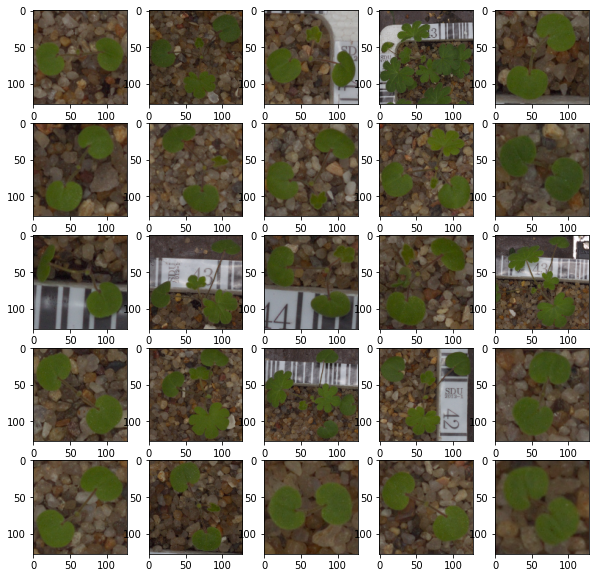

In [28]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i])

plt.show()

* The Small Flowered Cranesbill tends to have a large leaf with a rounded heart-shape. However, there are some instances where the leaves tend to have two-three circles at the end and look similar to clover, which may cause an issue.
* In most of the images the leaves take up most of the frame. Furthermore this class is 10.4% of the data, a fairly large proportion, so we shouldn't have too much trouble classifying this seedling.

#### Fat Hen Images

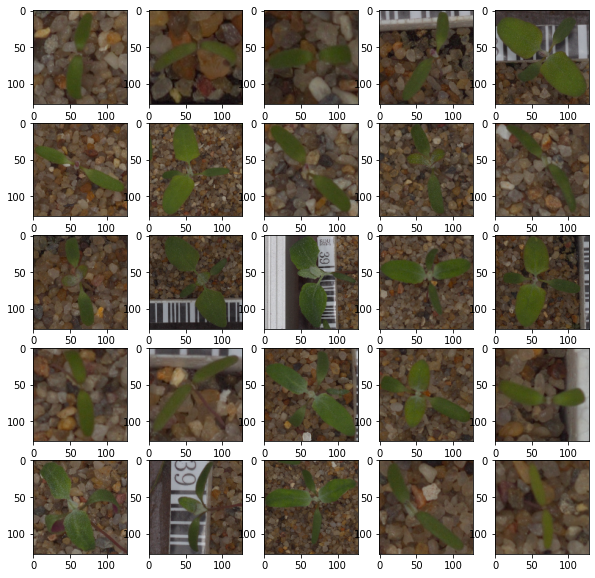

In [29]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+496])

plt.show()

* The Fat Hen seedling has elongated leaves, in what looks like pairs of 2 or 4.
* Again the seedling takes up much of the image and has a significant proportion of the data (10%). We should have no trouble classifying Fat Hen.

#### Shepherds Purse Images

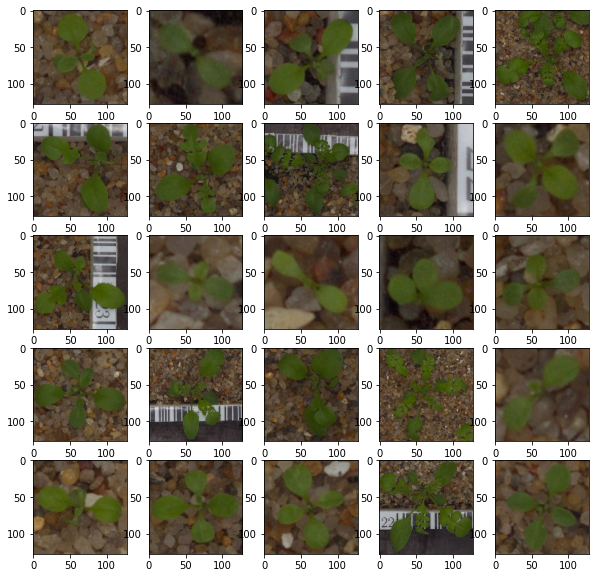

In [30]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+971])

plt.show()

* Shepherds Purse, looks quite similar to Fat Hen, however the leaves are slightly shorter and rounder.
* Shepherds Purse images are only 4.9% of the data. Given its similarity to Fat Hen, there may be some issues classifying this seedling class.

#### Common Wheat Images

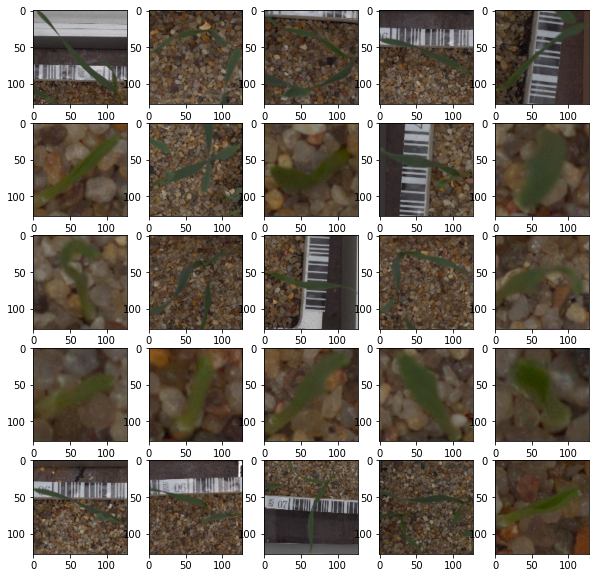

In [31]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+1202])

plt.show()

* Common wheat seedlings look like long thin strands of grass. Quite a few of the images are blurred.
* In addition the photos have not been taken at a consistent distance, leading to the leaf appearing thicker and thinner depending on the distance. The leaves only take up a small proportion of most of the images, with the rest being the noisy background (common to all images). Given that only 4.65% of the images are common wheat images, it might be hard to classify this seedling.

#### Common Chickweed Images

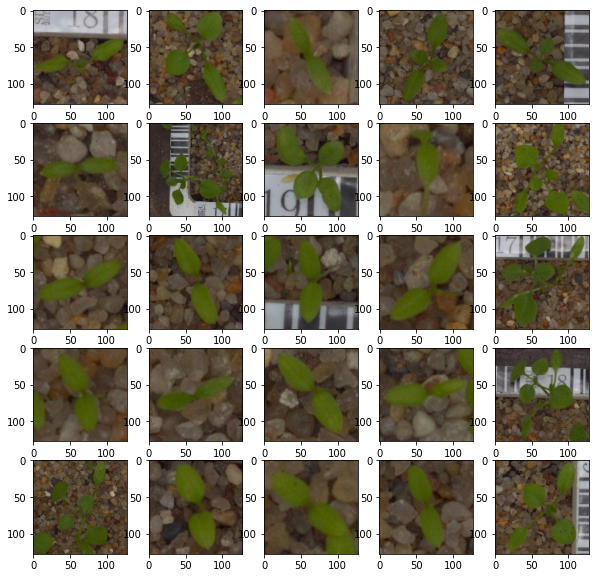

In [32]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+1423])

plt.show()

* Common Chickweed seedlings look very similar to the Fat Hen and Sheperds Purse seedlings, especially in the images with only 2 leaves. 
* There are images where there are more leaves, the mix of 2 and multi leaf images might hurt our classification ability with this seedling.
* Common Chickweed is the 2nd most popular seedling class at 12.86% of images. So perhaps this seedling will be classified well despite the challenges.

#### Charlock Images

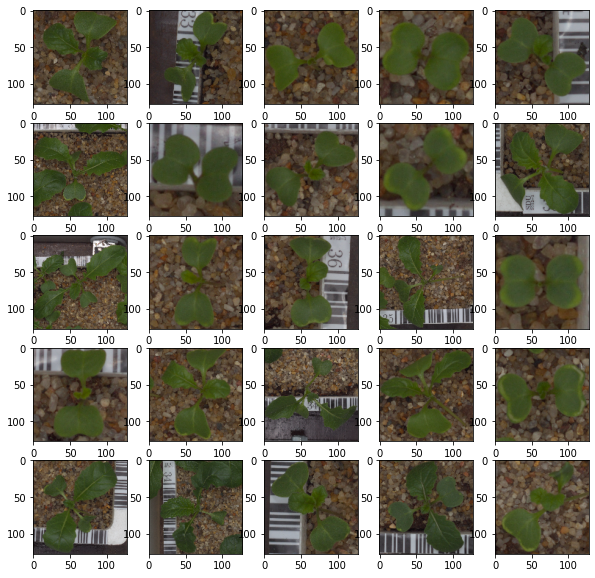

In [33]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+2034])

plt.show()

* Charlock leaves appear as hearts or feathers and is distinct from the leaves that we have described so far in the data.
* In addition Charlock images account for 8.2% of data, a reasonable amount, so we expect this seedling to be classified well.

#### Cleavers Images

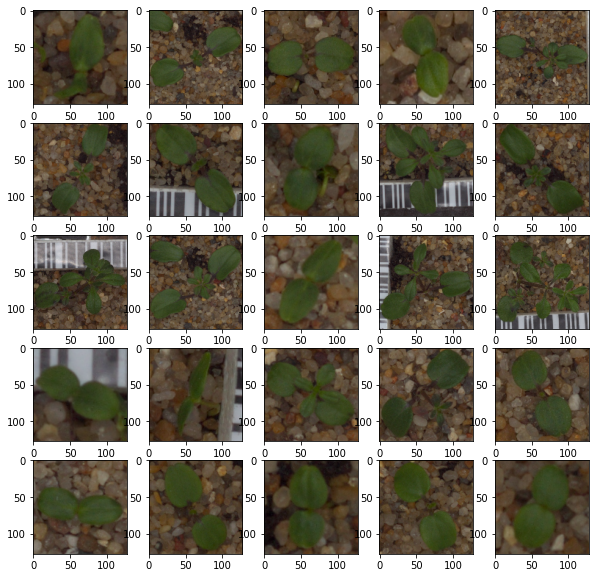

In [34]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+2424])

plt.show()

* Cleavers looks similar to Fat Hen, but is darker green with more rounded leaves and often has a distinct centre line down the leaf.
* Cleavers images are 6% of the data, a little on the low side. It will be interesting to see how well our CNN classifies this seedling type.


#### Scentless Mayweed Images

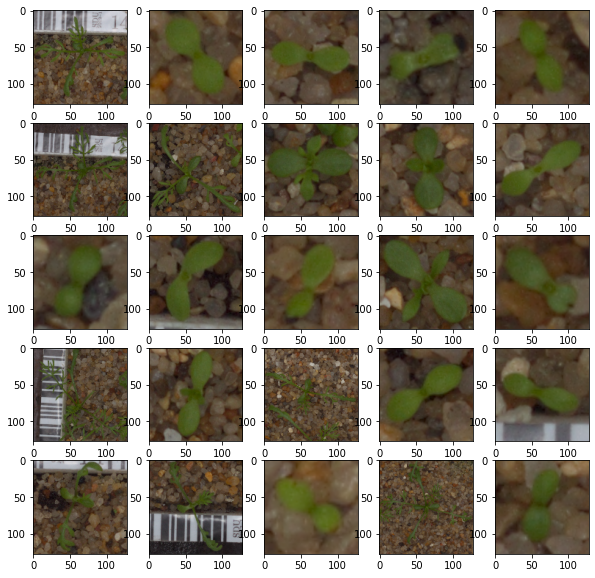

In [35]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+2711])

plt.show()

* There is quite a bit of variablitly in the leaf shape of this seedling, for this reason the seeling class may fair worse in the classification.
* When the leaves are shorter and fatter they look very similar to Common Chickweed.
* However there are a good proporiton of Scentless Mayweed images in the data (11%) so we may see this seedling well classified.

#### Sugar Beet Images

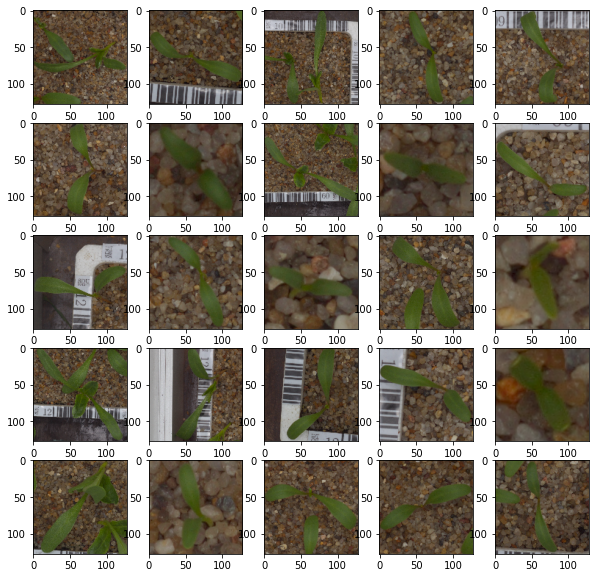

In [36]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+3227])

plt.show()

* Sugar Beet looks similar to Fat Hen, only longer and with more curve in the leaf. The leaves also do not tend to mirror each other like we see in Fat Hen
* 8% of images are Sugar Beet, a fair proportion.

#### Maize Images

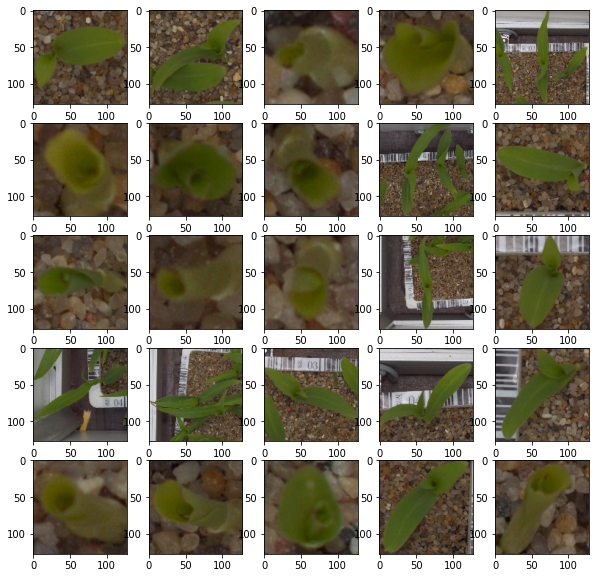

In [37]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+3612])

plt.show()

* The central part of this seedling is very distinct from the others, tending to form a tube of curved, long leaves.
* Maize only accounts for 4.65% of the images, the joint lowest. Hopefully the distinct shape will help separate this class from the others in our CNN.

#### Black-Grass Images

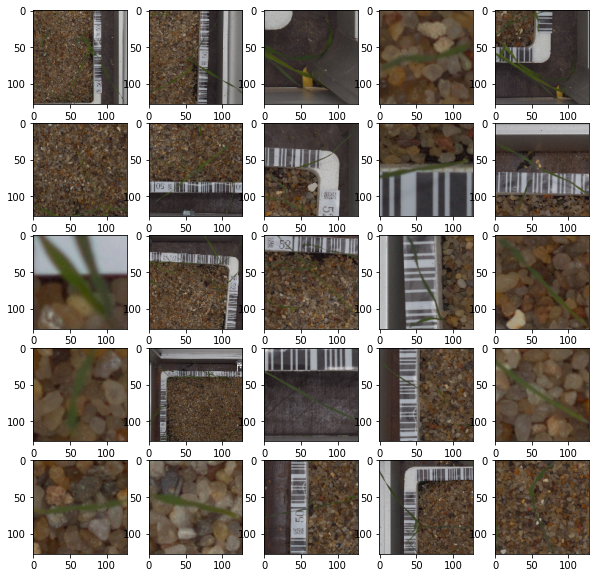

In [38]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+3833])

plt.show()

* Similar to Common Wheat, Black Grass has very long thin leaves that often struggle to be separated from the noisy background. Even when the image of the leaf is discernable, it covers a tiny portion of the image.
* In addition, Black-grass is only 5.5% of the data. We expect the CNN to have some trouble with this class.

#### Loose Silky-Bent

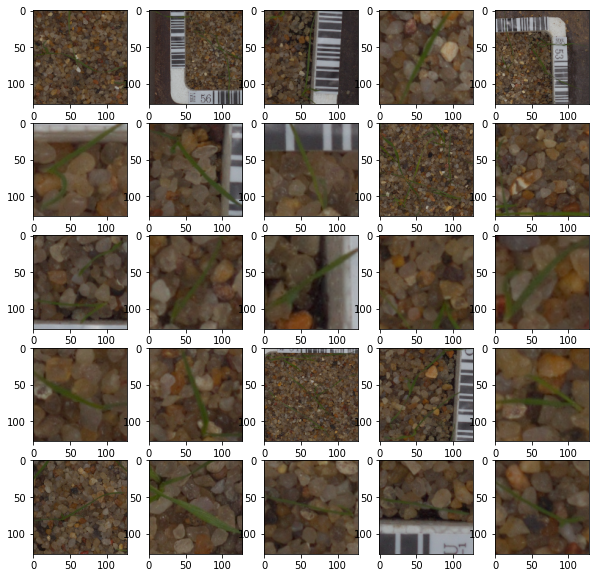

In [39]:
plt.figure(figsize=(10,10)) # specifying the overall grid size
for i in range(25):
    plt.subplot(5,5,i+1)    # the number of images in the grid is 5*5 (25)
    plt.imshow(images_rgb[i+4096])

plt.show()

* Loose Silky-Bent is similar to common wheat and black-grass in shape. We expect it to have the same problems.
* However Loose Silky-Bent is the most common class in the data at 13.8%.

## Plot Mean Image for Each Class
* Now that we have a fair idea what each seedling looks like, we can go on with the task of plotting an average for each seedling. 
* I have attempted this task a number of times and it works better in greyscale. 
  - We will first convert all images to greyscale.
  - We will then split the images into a separate tensors. One tensor per seedling class.
  - We can then get the average image for each seedling class and plot.

### Greyscale images

In [40]:
# Create an empty tensor with shape (4750,128,128), note the we have lost the 3 colour channels so the shape has changed.
images_grey = np.empty((4750, 128, 128))

# Loop through all images and greyscale them using cv2
for idx, img in enumerate(images):
  images_grey[idx] = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# The output from the above opperation is float64. We will convert to float32
# this should be sufficient for our purposes and will avoid memory issues in Colab
images_grey = images_grey.astype('float32')

In [41]:
# Check the output data type
images_grey.dtype

dtype('float32')

In [42]:
# check the output shape the shape
images_grey.shape

(4750, 128, 128)

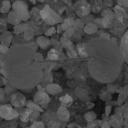

In [43]:
# Plot a test image
cv2_imshow(images_grey[0])

* We have successfully converted the images to greyscale and saved them in the images_grey tensor. We can now split the greyscaled images into separate tensors - one for each seedling type.

#### Split Greyscale Images into Separate Tensors
We know that the images are in an order. I.e. all images of a single seedling are grouped together. We just need to know the index number of the first and last instance of that seedling and we will know the range that contains all images of that seedling class.

In [44]:
# This command will separate the labels based on seedling name, then print out the first index number.
for seedling in seedling_names:
  print(labels[labels['Label']== seedling].head(1).index[0], seedling)

0 Small-flowered Cranesbill
496 Fat Hen
971 Shepherds Purse
1202 Common wheat
1423 Common Chickweed
2034 Charlock
2424 Cleavers
2711 Scentless Mayweed
3227 Sugar beet
3612 Maize
3833 Black-grass
4096 Loose Silky-bent


The output above shows that:
* Images 0-495 are Small-flowered Cranesbill. Images 496-970 are Fat Hen. Images 971-1201 are Shepherds Purse, etc.
* We can now separate the images of each class into separate numpy arrays.

In [45]:
# Using the output above we can separate the images_grey tensor into a tensor for each seedling class
cranesbill = images_grey[0:496,:,:]
fathen = images_grey[496:971,:,:]
shepherds = images_grey[971:1202,:,:]
wheat = images_grey[1202:1423,:,:]
chickweed = images_grey[1423:2034,:,:]
charlock = images_grey[2034:2424,:,:]
cleavers = images_grey[2424:2711,:,:]
mayweed = images_grey[2711:3227,:,:]
beet = images_grey[3227:3612,:,:]
maize = images_grey[3612:3833,:,:]
grass = images_grey[3833:4096,:,:]
silkybent = images_grey[4096:4750,:,:]

# Create a list of the seedling tensors, we need this for the printout below.
seedling_tensor_list = [cranesbill,fathen,shepherds,wheat,chickweed,charlock,cleavers,mayweed,beet,maize,grass,silkybent]

# Print out the shape of tensors for each seedling class
for i in range(0,12):
  print('Shape of',seedling_names[i],'tensor is:',seedling_tensor_list[i].shape)


Shape of Small-flowered Cranesbill tensor is: (496, 128, 128)
Shape of Fat Hen tensor is: (475, 128, 128)
Shape of Shepherds Purse tensor is: (231, 128, 128)
Shape of Common wheat tensor is: (221, 128, 128)
Shape of Common Chickweed tensor is: (611, 128, 128)
Shape of Charlock tensor is: (390, 128, 128)
Shape of Cleavers tensor is: (287, 128, 128)
Shape of Scentless Mayweed tensor is: (516, 128, 128)
Shape of Sugar beet tensor is: (385, 128, 128)
Shape of Maize tensor is: (221, 128, 128)
Shape of Black-grass tensor is: (263, 128, 128)
Shape of Loose Silky-bent tensor is: (654, 128, 128)


* The list above shows that we have created a tensor for each seedling type.
* The tensor shape for each is Nx128x128, where N is the number of images in the tensor. 128x128x3 is for the 128 pixels of height and width. Note that these are greyscale images so there is no axis for colour.
* Let's compare the output above with the one below to make sure there are the right number of images in each tensor.

In [46]:
labels.value_counts()

Label                    
Loose Silky-bent             654
Common Chickweed             611
Scentless Mayweed            516
Small-flowered Cranesbill    496
Fat Hen                      475
Charlock                     390
Sugar beet                   385
Cleavers                     287
Black-grass                  263
Shepherds Purse              231
Maize                        221
Common wheat                 221
dtype: int64

The number of images per seedling class tensor matches the value count of the seedling class in the labels. I'm satisfied that we have correctly split the seedlings into separate tensors.

#### Flatten and Average the Images of Each Seedling
We now need to flatten each 128x128 image in the tensors to a single row of 16384 columns (128*128=16384). We can then average down the columns and reshape to get a single array (128x128) where each pixel is the average across all the images of that pixel position.

In [47]:
# Flatten each tensor into a ringle row per images with 16384 columns, one for each pixel
cranesbill = cranesbill.reshape(496,16384)
fathen = fathen.reshape(475,16384)
shepherds = shepherds.reshape(231,16384)
wheat = wheat.reshape(221,16384)
chickweed = chickweed.reshape(611,16384)
charlock = charlock.reshape(390,16384)
cleavers = cleavers.reshape(287,16384)
mayweed = mayweed.reshape(516,16384)
beet = beet.reshape(385,16384)
maize = maize.reshape(221,16384)
grass = grass.reshape(263,16384)
silkybent = silkybent.reshape(654,16384)

In [48]:
# Average down the columns. This will find the average for each pixel position
cranesbill = np.mean(cranesbill, axis=0)
fathen = np.mean(fathen, axis=0)
shepherds = np.mean(shepherds, axis=0)
wheat = np.mean(wheat, axis=0)
chickweed = np.mean(chickweed, axis=0)
charlock = np.mean(charlock, axis=0)
cleavers = np.mean(cleavers, axis=0)
mayweed = np.mean(mayweed, axis=0)
beet = np.mean(beet, axis=0)
maize = np.mean(maize, axis=0)
grass = np.mean(grass, axis=0)
silkybent = np.mean(silkybent, axis=0)

In [49]:
# Reshape the averaged images back to 128x128 for display
cranesbill = cranesbill.reshape(128,128)
fathen = fathen.reshape(128,128)
shepherds = shepherds.reshape(128,128)
wheat = wheat.reshape(128,128)
chickweed = chickweed.reshape(128,128)
charlock = charlock.reshape(128,128)
cleavers = cleavers.reshape(128,128)
mayweed = mayweed.reshape(128,128)
beet = beet.reshape(128,128)
maize = maize.reshape(128,128)
grass = grass.reshape(128,128)
silkybent = silkybent.reshape(128,128)



#### Plot the Average Seedling Images
I find that plt.show() does a better job than cv2_imshow() for these images. I will plot the images and then discuss below.

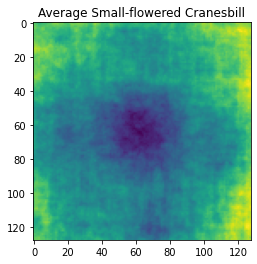

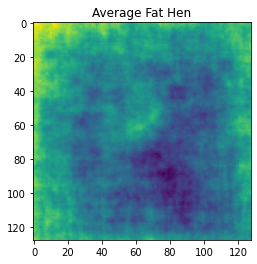

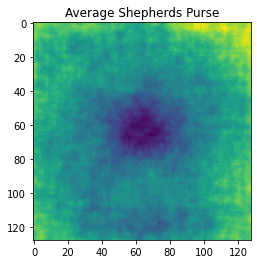

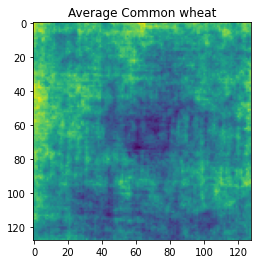

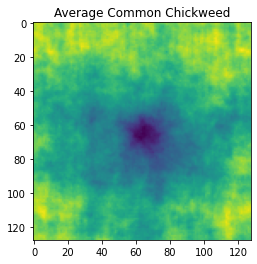

...

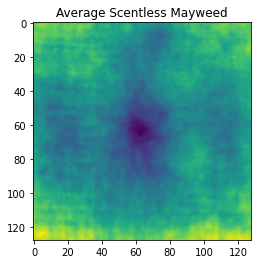

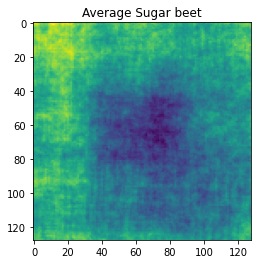

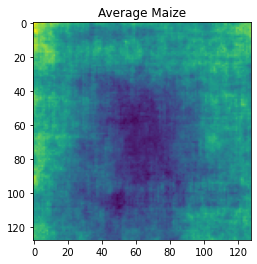

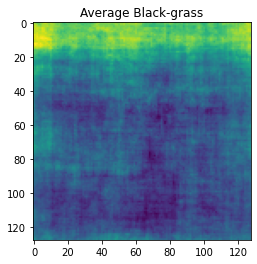

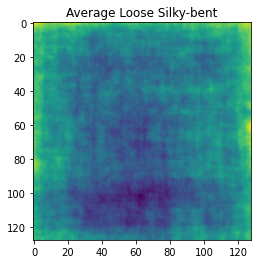

In [50]:
# We need to create this list again so that it fills with the new shaped tensors (now 128x128 arrays)
seedling_tensor_list = [cranesbill,fathen,shepherds,wheat,chickweed,charlock,cleavers,mayweed,beet,maize,grass,silkybent]

# Now we can create a loop to plot all the average images
for i in range(0,12):
  plt.imshow(seedling_tensor_list[i])
  plt.title(('Average ' + seedling_names[i]))
  plt.show()

#Illustrate the insights based on EDA
*-Key meaningful observations from EDA*

We will talk about the average images first as they are directly above, we will then make some general comments.

#### Average Images:
* When looking at the average images, we can see distinct patterns of dark and light. The dark patches represent leaves the light patches represent the background.
* We can see that in average plots for Common Wheat, Black Grass and Loose Silky-Bent, the image is more homogenous. This occurs in the ‘grass like’ seedlings, when the leaves are long, thin strands. The leaves occur in different locations in each image and, relative to the background and tend to take up less of the image than the other seedling classes. We expect to have more trouble classifying these seedling types than the others. This will likely be compounded by the fact that Common Wheat and Black Grass are some of the less populous classes in the data set, so we expect to have the most trouble with these two seedlings.
* For the other average images, we tend to see a strong darker circle in the middle of the image and lighter surrounds. We expect better classification of seedling classes with this type of average image.

#### General Observations
* The different seedling classes are not balanced within the data set. We expect classes with less representation in the dataset to have less accurate classification than those with higher representation. This is especially true for seedling classes that do not have distinct leaf shapes or have a homogeneous average image (Common Wheat, Black Grass, Loose Silky-Bent).
* We expect seedlings with very distinct shapes, like Charlock, Maize and Small-Flowered Cranesbill to be accurately classified by our CNN.
* Seedlings which can look similar, like Fat Hen and Chickweed may be confused with each other.



In [51]:
# Before moving onto the next section, let's clean up by deleting all the unneeded tensors we have created, in order to save memory
del (cranesbill, fathen, shepherds, wheat, chickweed, charlock, cleavers, mayweed, beet, maize, grass, silkybent, seedling_tensor_list)

# Data Pre-Processing
*-Remove unwanted noise from the images using Guassian Blurring -Apply the normalization -Plot the images before and after the pre-processing steps ( Blurring & Normalization ) -Split the data into train and test*

## Guassian Blurring
Let's apply Guassian Blurring to the images. We will start with a 5x5 filter.

In [52]:
# Create an empty tensor, we will then iterate through the images and store the blurred images in this tensor.
images_blur = np.empty((4750,128,128,3))

# iterate through each image, applying a 5x5 Guassian filter
for idx, img in enumerate(images):
  images_blur[idx] = cv2.GaussianBlur(img, (5, 5), 0)

Let's test the Guassian Blurring by looking at an image, we will plot more images after normalization

Original Image


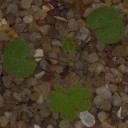

Image after 5x5 Guassian Blurring


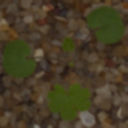

In [53]:
print('Original Image')
cv2_imshow(images[1])
print('Image after 5x5 Guassian Blurring')
cv2_imshow(images_blur[1])

The image after the blurring looks more blurry, so the process has worked

## Normalization
* Neural networks process inputs using small weight values, and inputs with large integer values can disrupt or slow down the learning process. As such it is good practice to normalize the pixel values so that each pixel value is between 0 and 1

* Before normalizing the original (0-255) values to a range of 0-1, it is typical to convert the original data type 'uint8' to a float data type.
* The Gaussian Blurring has already converted the data to float64. I am going to convert this to float32 to save memory (as I have been having issues running out of RAM on Colab).

In [54]:
print('Data Type before Guassian Blurring: %s' % images.dtype)
print('Data Type after Guassian Blurring: %s' % images_blur.dtype)
images_blur = images_blur.astype('float32')
print('Data Type after Bluring and Type Conversion: %s' % images_blur.dtype)

Data Type before Guassian Blurring: uint8
Data Type after Guassian Blurring: float64
Data Type after Bluring and Type Conversion: float32


In [55]:
# Show data type and range before normalization
print('Data Before Normalization')
print('Data Type: %s' % images_blur.dtype)
print('Min: %.3f, Max: %.3f' % (images_blur.min(), images_blur.max()))
# copy the data to a new variable before normalization to preserve the steps
images_blur_norm = images_blur.copy()
# normalize to the range 0-1
images_blur_norm /= 255.0
# confirm the normalization
print()
print('Data After Normalization')
print('Data Type: %s' % images_blur_norm.dtype)
print('Min: %.3f, Max: %.3f' % (images_blur_norm.min(), images_blur_norm.max()))

Data Before Normalization
Data Type: float32
Min: 0.000, Max: 255.000

Data After Normalization
Data Type: float32
Min: 0.000, Max: 1.000


* After the normalization, the data type is float32 and the range of values in each pixel is from 0-1

## Plot Images Before and After Pre-Processing
Let's start by plotting a sample before and after image

Original Image


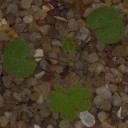

Image after Pre-Processing


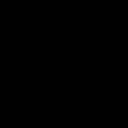

In [56]:
print('Original Image')
cv2_imshow(images[1])
print('Image after Pre-Processing')
cv2_imshow(images_blur_norm[1])

* We can see that the after image is black. 
* This is because cv2_imshow expects pixel values between 0-255 and we are feeding it values between 0-1, the very low pixel intensities result in a black image.
* We can fix this by multiplying our normalized images by 255 (for display purposes)

Original Image


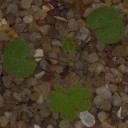

Image after Pre-Processing (with 255 scalar)


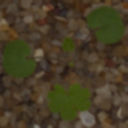

In [57]:
print('Original Image')
cv2_imshow(images[1])
print('Image after Pre-Processing (with 255 scalar)')
cv2_imshow((images_blur_norm[1])*255) # This time we multiply the pixel intensities by 255 so that it displays correctly

* After multiplying our normalized image by 255, it looks no different to the blurred image. 
* This is what we expect. It shows that a) our blurring has worked and b) our normalization has worked.

The marking rubric states "Plot *images* before and after the pre-processing steps". The plural form "images" implies that I need to show more than one. I will plot the first image of each seedling type before and after pre-processing

Small-flowered Cranesbill


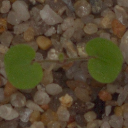

Small-flowered Cranesbill after pre-processing


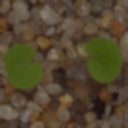

Fat Hen


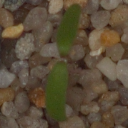

Fat Hen after pre-processing


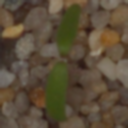

Shepherds Purse


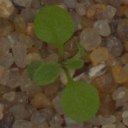

Shepherds Purse after pre-processing


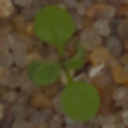

Common wheat


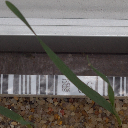

Common wheat after pre-processing


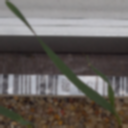

Common Chickweed


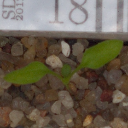

Common Chickweed after pre-processing


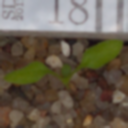

Charlock


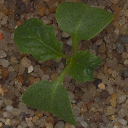

Charlock after pre-processing


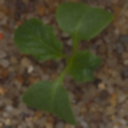

Cleavers


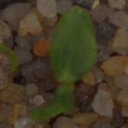

Cleavers after pre-processing


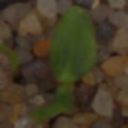

Scentless Mayweed


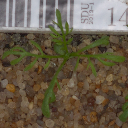

Scentless Mayweed after pre-processing


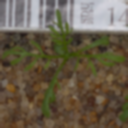

Sugar beet


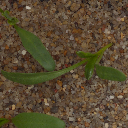

Sugar beet after pre-processing


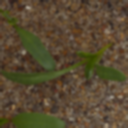

Maize


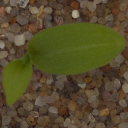

Maize after pre-processing


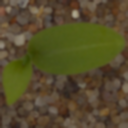

Black-grass


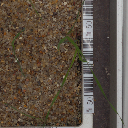

Black-grass after pre-processing


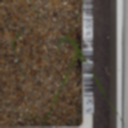

Loose Silky-bent


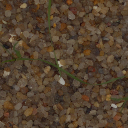

Loose Silky-bent after pre-processing


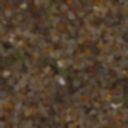

In [58]:
for seedling in seedling_names:
  index_num = labels[labels['Label']== seedling].head(1).index[0] #sort the labels data frame to just show one seedling, show the first row (i.e. lowest index number where the seedling appears), read the index number
  print(labels.iloc[index_num,0]) # print the corresponding label for the seedling image
  cv2_imshow(images[index_num]) # use the index number in the previous step to plot a specific image
  

  #now to plot the same image AFTER the processing (with the scalar)
  print(labels.iloc[index_num,0],'after pre-processing')
  cv2_imshow(images_blur_norm[index_num]*255)
  

* We have now plotted an image for each seedling type before and after pre-processing. This should hopefully satisfy the scoring rubric!
* The processed images are blurred and need be be multiplied by 255 to display, so our processing has worked as intended.

## Split Data into Train, Validation and Test
* We saw in our data load that the distribution of the classes is not even. 
* In order to maintain the distribution in our train, test and validation data, we will make use of the "stratify" argument in train_test_split.
* We will first split the train and test data using test_size = 0.3
* We will then further split the train data into training and validation using a test_size = 0.5
* This follows the guidelines in the pdf attached with the project.


In [59]:
# We will copy our pre-processed images and labels into X and y variables
X = images_blur_norm.copy()
y = labels.copy()

#### First Split:
Split data into train and test.

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)

Now let's check the split percentages of the different data sets:

In [61]:
# We can check the percentage of the split using the X data
print("{0:0.2f}% data is in training set".format((len(X_train)/len(X)) * 100))
print("{0:0.2f}% data is in test set".format((len(X_test)/len(X)) * 100))

70.00% data is in training set
30.00% data is in test set


In [62]:
# We can also check the percentage of the split using the y data
print("{0:0.2f}% data is in training set".format((len(y_train)/len(y)) * 100))
print("{0:0.2f}% data is in test set".format((len(y_test)/len(y)) * 100))

70.00% data is in training set
30.00% data is in test set


* We can see that our test_train_split with test_size = 0.3 has perfectly split our data into the correct percentages of the original size.
* Furthermore, if we test the split using the X or y data, we get the same result. This shows that both our images (X) and labels (y) have been split correctly

#### Second Split:
Split train data further into train and validation datasets.

In [63]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.5, random_state=1, stratify=y_train)

In [64]:
# We can check the percentage of the split using the X data
print("{0:0.2f}% data is in training set".format((len(X_train)/len(X)) * 100))
print("{0:0.2f}% data is in validation set".format((len(X_val)/len(X)) * 100))

34.99% data is in training set
35.01% data is in validation set


* Our train data is 70% of the original data. We then split this in half to get the final train and validation datasets.
* We can see that the training data has 34.99% of the data and the validation set has 35.01%. So, the data have a near-perfect split.

#### Check Class Proportions in Each Data Set
Let's check to see that the class proportions in the original data set has been preserved across the different data sets we have created.

In [65]:
print('Proportions in the Original Data')
print((y.value_counts() / len(y))*100)
print()
print('Proportions in Train Data')
print((y_train.value_counts() / len(y_train))*100)
print()
print('Proportions in Validation Data')
print((y_val.value_counts() / len(y_val))*100)
print()
print('Proportions in Test Data')
print((y_test.value_counts() / len(y_test))*100)

Proportions in the Original Data
Label                    
Loose Silky-bent             13.768421
Common Chickweed             12.863158
Scentless Mayweed            10.863158
Small-flowered Cranesbill    10.442105
Fat Hen                      10.000000
Charlock                      8.210526
Sugar beet                    8.105263
Cleavers                      6.042105
Black-grass                   5.536842
Shepherds Purse               4.863158
Maize                         4.652632
Common wheat                  4.652632
dtype: float64

Proportions in Train Data
Label                    
Loose Silky-bent             13.778580
Common Chickweed             12.876053
Scentless Mayweed            10.830325
Small-flowered Cranesbill    10.409146
Fat Hen                       9.987966
Charlock                      8.182912
Sugar beet                    8.062575
Cleavers                      6.077016
Black-grass                   5.535499
Shepherds Purse               4.873646
Maize          

* The proportions of the classes in the train, validation and test data sets are very similar to the original proportions. Success!


# Make data compatible
*- Convert labels from digits to one hot vector. - Check the shape of the data. Reshape the data into shapes compatible with Keras models, if already not compatible.*

In [66]:
# We will One Hot Encode the y data to change the string labels into numbers. We will need sparse = False to be compatible with our CNN.
seedling_names = ['Small-flowered Cranesbill','Fat Hen', 'Shepherds Purse', 'Common wheat', 'Common Chickweed', 'Charlock', 'Cleavers', 'Scentless Mayweed', 'Sugar beet', 'Maize', 'Black-grass', 'Loose Silky-bent' ]
onehot = OneHotEncoder(sparse=False)
y_train = onehot.fit_transform(y_train)
y_val = onehot.transform(y_val)
y_test = onehot.transform(y_test)

In [67]:
# Now Let's Check the Shapes
# Training Shapes
print('X train shape:', X_train.shape)
print('y train shape:', y_train.shape)
print('X validation shape', X_val.shape)
print('y validation shape', y_val.shape)
print('X test shape', X_test.shape)
print('y test shape', y_test.shape)

X train shape: (1662, 128, 128, 3)
y train shape: (1662, 12)
X validation shape (1663, 128, 128, 3)
y validation shape (1663, 12)
X test shape (1425, 128, 128, 3)
y test shape (1425, 12)


* We can see that the shapes of the X data are all Nx128x128x3 where N is the number of images in the data.
* The shapes of the y data are all Nx12, where N is the number of images and it matches the number of images in the corresponding X data. 12 is the number of columns. There is one colume for each class. For each row, a single column will have a value of one, indicating the class, all other columns will be zero.
* The output of our model will be Nx12. Again, N is the number of images fed into the model. For each row, the 12 columns will be have a fractional percentage prediction for each class, with the sum of each row = 1.
* We will compare the argmax of the model output (the maximum percentage is the class the model predicts to be the most likely) vs. the argmax of the training data (in this case the argmax will be the 1 in the column class as all other values will be zero).
* We can see below a sample y data (y test). There are 12 columns, with a one in the column

# Model building
*- Build Convolution Neural Network*

### Prep-Work
Below are operations that we will perform multiple times. For this reason they have been defined as functions.

In [68]:
# This function will make a plot of the training loss vs. the validation loss after running a CNN

# The input N is the number of epochs in the model.
# When we train the model we save the model.fit to history
def get_history_plot(N):
    plt.figure(figsize=(8,6))
    plt.plot(np.arange(0, N), history.history["loss"], label="train_loss")
    plt.plot(np.arange(0, N), history.history["val_loss"], label="val_loss")
    plt.title("Training Loss and Validation loss on the dataset")
    plt.xlabel("Epoch #")
    plt.ylabel("train_Loss/val_loss")
    plt.legend()
    plt.show()

In [69]:
# This function will plot a confusion matrix given the input dataset.

# The OneHotEncoder encodes the labels in alphabetical order, for this reason we need an alphabetical list of our seedlings.
seedlings_alphabetical = ['Black-grass','Charlock','Cleavers','Common Chickweed','Common wheat','Fat Hen','Loose Silky-bent','Maize','Scentless Mayweed',
                          'Shepherds Purse','Small-flowered Cranesbill','Sugar beet']

def get_cm(X_data,y_data):

  y_pred = classifier.predict(X_data) # get predicted labels (y) from our input X data

  cm = confusion_matrix(y_data.argmax(axis=1), y_pred.argmax(axis=1)) # make the confusion matrix

  df_cm = pd.DataFrame(cm, index = [seedlings_alphabetical], columns = [seedlings_alphabetical]) # convert the cm to a dataframe with labels
  plt.figure(figsize = (10,7))
  sns.heatmap(df_cm, annot=True, fmt='d') # plot a nice looking heatmap of the confusion matrix
  plt.ylabel('True label')
  plt.xlabel('Predicted label')

## Build Initial Model
For our initial model, we will have:
* 3 Convolution Layers, each with a pooling layer afterwards
* 2 Dense Layers, with a dropout layer in between.
* The output layer with 12 neurons (one for each class) and the softmax activation function.

In [70]:
def create_initial_model():
  # Initialising the CNN classifier
  classifier = Sequential()

  # Add a Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(32, (3, 3), input_shape = (128, 128, 3), activation = 'relu', padding = 'same'))

  # Add a Max Pooling layer of size 2X2
  classifier.add(MaxPooling2D(pool_size = (2, 2)))

  # Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))

  # Adding another pooling layer
  classifier.add(MaxPooling2D(pool_size = (2, 2)))

  # Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'valid'))

  # Adding another pooling layer
  classifier.add(MaxPooling2D(pool_size = (2, 2)))

  # Flattening the layer before fully connected layers
  classifier.add(Flatten())

  # Adding a fully connected layer with 512 neurons
  classifier.add(Dense(units = 512, activation = 'relu'))

  # Adding dropout with probability 0.5
  classifier.add(Dropout(0.5))


  # Adding a fully connected layer with 128 neurons
  classifier.add(Dense(units = 128, activation = 'relu'))


  # The final output layer with 10 neurons to predict the categorical classifcation
  classifier.add(Dense(units = 12, activation = 'softmax'))

  return classifier

In [71]:
classifier = create_initial_model()
classifier.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 30, 30, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 7200)              0

In [72]:
classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

### Run Model

In [73]:
history = classifier.fit(X_train,y_train,
                         steps_per_epoch = int(1662/32),
                         epochs = 10,
                         validation_data = (X_val,y_val),
                         validation_steps = int(1663/32))

Epoch 1/10
51/51 [==============================] - 35s 56ms/step - loss: 2.4226 - accuracy: 0.1468 - val_loss: 2.3195 - val_accuracy: 0.1768
Epoch 2/10
51/51 [==============================] - 2s 39ms/step - loss: 2.1192 - accuracy: 0.2659 - val_loss: 1.8426 - val_accuracy: 0.3554
Epoch 3/10
51/51 [==============================] - 2s 41ms/step - loss: 1.7552 - accuracy: 0.3845 - val_loss: 1.5824 - val_accuracy: 0.4167
Epoch 4/10
51/51 [==============================] - 2s 39ms/step - loss: 1.5152 - accuracy: 0.4615 - val_loss: 1.3795 - val_accuracy: 0.5310
Epoch 5/10
51/51 [==============================] - 2s 40ms/step - loss: 1.2989 - accuracy: 0.5457 - val_loss: 1.2227 - val_accuracy: 0.5815
Epoch 6/10
51/51 [==============================] - 2s 39ms/step - loss: 1.1895 - accuracy: 0.5909 - val_loss: 1.1806 - val_accuracy: 0.5989
Epoch 7/10
51/51 [==============================] - 2s 39ms/step - loss: 1.0783 - accuracy: 0.6227 - val_loss: 1.1106 - val_accuracy: 0.6284
Epoch 8/10
5

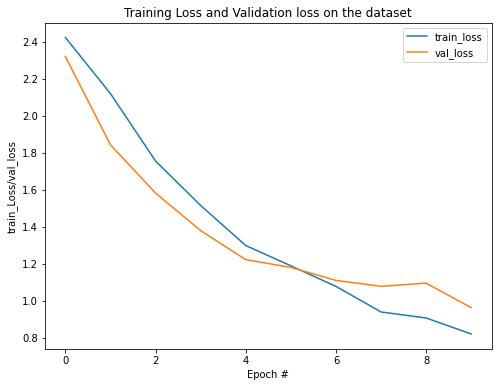

In [74]:
get_history_plot(10)

### Model Evaluation

In [75]:
classifier.evaluate(X_test,y_test)

45/45 [==============================] - 1s 15ms/step - loss: 0.9956 - accuracy: 0.6765


[0.9955586194992065, 0.6764912009239197]

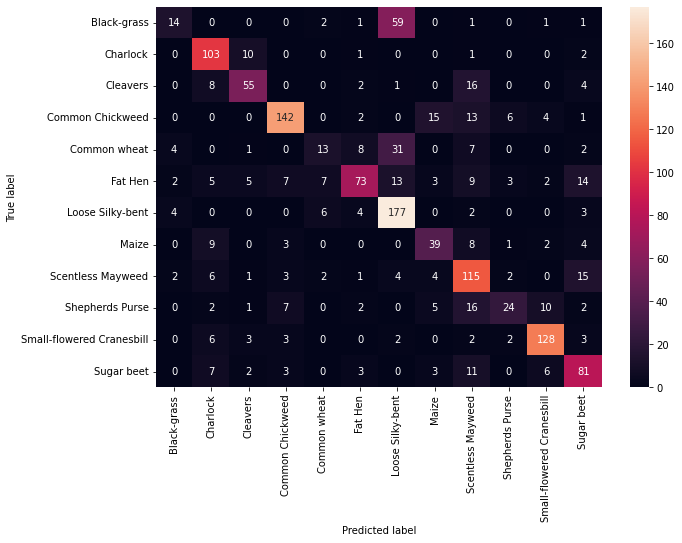

In [76]:
get_cm(X_test,y_test)

In [77]:
y_pred = classifier.predict(X_test)
print("=== Classification Report ===")
print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

=== Classification Report ===
              precision    recall  f1-score   support

           0       0.54      0.18      0.27        79
           1       0.71      0.88      0.78       117
           2       0.71      0.64      0.67        86
           3       0.85      0.78      0.81       183
           4       0.43      0.20      0.27        66
           5       0.75      0.51      0.61       143
           6       0.62      0.90      0.73       196
           7       0.57      0.59      0.58        66
           8       0.57      0.74      0.65       155
           9       0.63      0.35      0.45        69
          10       0.84      0.86      0.85       149
          11       0.61      0.70      0.65       116

    accuracy                           0.68      1425
   macro avg       0.65      0.61      0.61      1425
weighted avg       0.68      0.68      0.66      1425



* We can see some of the problems that we expected after our EDA:
  - Common Wheat and Black Grass are often classified as Loose Silky-bent. These 3 seedlings have a common shape, however Loose Silky-bent is the most populous in the data while Black-grass and Common Wheat are some of the rarest.
  - We also see seedlings with similar shapes, eg. Fat Hen and Sugar Beet being confused for each other.
* Hopefully we can improve upon these results in the next section.

# Model Performance Improvement
*- Comment on model performance - Can model performance be improved? check and comment - Build another model to implement these improvements Model Performance Improvement*

Our initial model accuracy is ~ 65-70% depending on the run (it's stochastic). It's not terrible, but it could likely be improved. Here are the steps that I plan to take.
* 1) Test input data. Given that our initial model performance is passible, we should be able to test different inputs without needing model tweaks first. It is likely better to test inputs first, given that the options are slightly more limited than the near infinite possibilites in CNN architecture: 
  - We can attempt a stronger Gaussian Blurring
  - We can greyscale the images and see if that helps
  - If both the above help, we can combine them.

* 2) Tune Parameters/adjust architecture. We will do this once we know the best input data from step 1.

## Test 1: Increase Gaussian Blurring Filter Size

#### Data Prep
* We will run the pre-processing again, this time with a larger Gaussian Filter. 
* We will double the filter to 11x11 (10x10 doesn't work as the filter sides need to be odd).
* As the code is exactly the same as before, with only the filter size changing, I will put less comments in this code. **Note** I tested the proportions to make sure they were the same as before, it's not shown in the notebook to save space.

Original Image


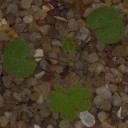

Image after 11x11 Guassian Blur (with 255 scalar)


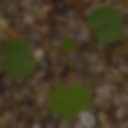

In [78]:
### Run the Gaussian Blurring ###
# Create an empty tensor, we will then iterate through the images and store the blurred images in this tensor.
images_blur = np.empty((4750,128,128,3))

# iterate through each image, applying a 11x11 Guassian filter
for idx, img in enumerate(images):
  images_blur[idx] = cv2.GaussianBlur(img, (11, 11), 0)

# blurring changes the type to float64, we will convert to float32 to save memory
images_blur = images_blur.astype('float32')

### Normalize the Blurred Data ###
# copy the data to a new variable before normalization to preserve the steps
images_blur_norm = images_blur.copy()
# normalize to the range 0-1
images_blur_norm /= 255.0

# We will copy our pre-processed images and labels into X and y variables
X_b11 = images_blur_norm.copy() #note that the b11 suffix refers to the blurring with window size 11x11
y_b11 = labels.copy()

### Split the Blurred and Normalized Data into Train, Validation and Test ###
# Split the data into train and test
X_train_b11, X_test_b11, y_train_b11, y_test_b11 = train_test_split(X_b11, y_b11, test_size=0.3, random_state=1, stratify=y_b11)

# Split the training data into train and validaion
X_train_b11, X_val_b11, y_train_b11, y_val_b11 = train_test_split(X_train_b11, y_train_b11, test_size=0.5, random_state=1, stratify=y_train_b11)

# Print a test image. It's the same image that we have printed before (both before and after the 5x5 blur) so we can compare it to images higher in the notebook.
print('Original Image')
cv2_imshow(images[1])
print('Image after 11x11 Guassian Blur (with 255 scalar)')
cv2_imshow((images_blur_norm[1])*255) 

The image with the 11x11 filter looks more blurred than before. Now that we have prepared the X data, we will prepare the y data again.

In [79]:
# We will One Hot Encode the y data to change the string labels into numbers. We will need sparse = False to be compatible with our CNN.
onehot = OneHotEncoder(sparse=False)
y_train_b11 = onehot.fit_transform(y_train_b11)
y_val_b11 = onehot.transform(y_val_b11)
y_test_b11 = onehot.transform(y_test_b11)

# Now Let's Check the Shapes
# Training Shapes
print('X train shape:', X_train_b11.shape)
print('y train shape:', y_train_b11.shape)
print('X validation shape', X_val_b11.shape)
print('y validation shape', y_val_b11.shape)
print('X test shape', X_test_b11.shape)
print('y test shape', y_test_b11.shape)

X train shape: (1662, 128, 128, 3)
y train shape: (1662, 12)
X validation shape (1663, 128, 128, 3)
y validation shape (1663, 12)
X test shape (1425, 128, 128, 3)
y test shape (1425, 12)


The label shapes are the same as before and look correct. Now it's time to build the model again and try it with the new input data.

#### Test 1: Model Build
Note that this is the same model as our initial model, we are just inputting the data with the stronger Guassian 

In [77]:
classifier = create_initial_model() # recreate the initial model, the difference this time will be the input data
classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

#### Test 1: Model Evaluation

In [78]:
history = classifier.fit(X_train_b11,y_train_b11,
                         steps_per_epoch = int(1662/32),
                         epochs = 10,
                         validation_data = (X_val_b11,y_val_b11),
                         validation_steps = int(1663/32))

Epoch 1/10
51/51 [==============================] - 3s 46ms/step - loss: 2.3758 - accuracy: 0.1757 - val_loss: 2.0311 - val_accuracy: 0.2772
Epoch 2/10
51/51 [==============================] - 2s 39ms/step - loss: 1.8282 - accuracy: 0.3688 - val_loss: 1.5635 - val_accuracy: 0.4293
Epoch 3/10
51/51 [==============================] - 2s 39ms/step - loss: 1.5777 - accuracy: 0.4380 - val_loss: 1.5024 - val_accuracy: 0.4877
Epoch 4/10
51/51 [==============================] - 2s 39ms/step - loss: 1.4012 - accuracy: 0.4868 - val_loss: 1.2685 - val_accuracy: 0.5628
Epoch 5/10
51/51 [==============================] - 2s 39ms/step - loss: 1.1847 - accuracy: 0.5890 - val_loss: 1.2741 - val_accuracy: 0.5580
Epoch 6/10
51/51 [==============================] - 2s 39ms/step - loss: 1.0987 - accuracy: 0.6095 - val_loss: 1.0558 - val_accuracy: 0.6392
Epoch 7/10
51/51 [==============================] - 2s 39ms/step - loss: 0.9559 - accuracy: 0.6534 - val_loss: 1.0283 - val_accuracy: 0.6524
Epoch 8/10
51

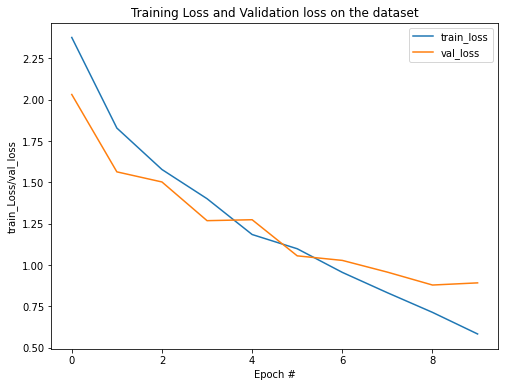

In [79]:
get_history_plot(10)

* The accuracy of the model is slightly better after increasing the Guassian Blurring filter from 5x5 to 11x11.
* **NOTE: At this point I tested 9x9, 11x11, 13x13 and 15x15. The best performing filter is 11x11.** I performed tests for each 5 times, I know that more than 30 is the *correct* way to do it, but I did not have that kind of time.
* Now that we know the model can be improved by using an 11x11 Gausian Blurring filter on the input data, let's input greyscale data and see if that improves the image and if so, what magnitude of improvement we get.

## Test 2: Greyscale Images
* We will now test the same initial model but input images that have been greyscaled to see if the accuracy of the model improves. 
* We already have a tensor containing greyscaled images (images_grey) that we created to make our average images. We simply need to prepare the greyscaled images by splitting them into train, validation and test sets.

#### Data Prep
* We will run the pre-processing again, this time with a the greyscaled images as input
* We will keep the filter size at 5x5 - the same as the inital model so that we can see if greyscaling or a stronger filter has a better affect on the accuracy.
* As the code is exactly the same as before, with only the filter size changing, I will put less comments in this code. **Note** I tested the proportions to make sure they were the same as before, it's not shown in the notebook to save space.

Original Image


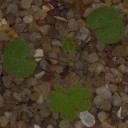

Image after 5x5 Guassian Blur and Greyscale (with 255 scalar)


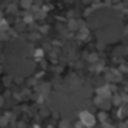

In [80]:
### Run the Gaussian Blurring ###
# Create an empty tensor, we will then iterate through the images and store the blurred images in this tensor.
images_grey_blur5 = np.empty((4750,128,128))

# iterate through each image, applying a 5x5 Guassian filter
for idx, img in enumerate(images_grey):
  images_grey_blur5[idx] = cv2.GaussianBlur(img, (5, 5), 0)

# blurring changes the type to float64, we will convert to float32 to save memory
images_grey_blur5 = images_grey_blur5.astype('float32')

### Normalize the Blurred Data ###
# copy the data to a new variable before normalization to preserve the steps
images_grey_blur5_norm = images_grey_blur5.copy()
# normalize to the range 0-1
images_grey_blur5_norm /= 255.0

# We will copy our pre-processed images and labels into X and y variables
X_gr = images_grey_blur5_norm.copy() #note that the b11 suffix refers to the blurring with window size 11x11
y_gr = labels.copy()

### Split the Blurred and Normalized Data into Train, Validation and Test ###
# Split the data into train and test
X_train_gr, X_test_gr, y_train_gr, y_test_gr = train_test_split(X_gr, y_gr, test_size=0.3, random_state=1, stratify=y_gr)

# Split the training data into train and validaion
X_train_gr, X_val_gr, y_train_gr, y_val_gr = train_test_split(X_train_gr, y_train_gr, test_size=0.5, random_state=1, stratify=y_train_gr)

# Print a test image. It's the same image that we have printed before (both before and after the 5x5 blur) so we can compare it to images higher in the notebook.
print('Original Image')
cv2_imshow(images[1])
print('Image after 5x5 Guassian Blur and Greyscale (with 255 scalar)')
cv2_imshow((images_grey_blur5_norm[1])*255) 

* Note that the colour of the plants contrasts with the background. This is not true when we greyscale the data.
* **Spoiler** the accuracy is much worse with greyscaled data, as we will see below...

In [81]:
# We will One Hot Encode the y data to change the string labels into numbers. We will need sparse = False to be compatible with our CNN.
onehot = OneHotEncoder(sparse=False)
y_train_gr = onehot.fit_transform(y_train_gr)
y_val_gr = onehot.transform(y_val_gr)
y_test_gr = onehot.transform(y_test_gr)

# Now Let's Check the Shapes
# Training Shapes
print('X train shape:', X_train_gr.shape)
print('y train shape:', y_train_gr.shape)
print('X validation shape', X_val_gr.shape)
print('y validation shape', y_val_gr.shape)
print('X test shape', X_test_gr.shape)
print('y test shape', y_test_gr.shape)

X train shape: (1662, 128, 128)
y train shape: (1662, 12)
X validation shape (1663, 128, 128)
y validation shape (1663, 12)
X test shape (1425, 128, 128)
y test shape (1425, 12)


In [82]:
# Finally we need to reshpae the training data as Conv2D expects a 4 dimentional array
X_train_gr = X_train_gr.reshape(1662,128,128,1)
X_val_gr = X_val_gr.reshape(1663,128,128,1)
X_test_gr = X_test_gr.reshape(1425,128,128,1)

#### Test 2: Model Build
Here we are changing the initial model very slightly. We need to change the input shape in the first layer to reflect the fact that we are using greyscale data and not colour images.

In [83]:
# Initialising the CNN classifier
classifier = Sequential()

# Add a Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), input_shape = (128, 128,1), activation = 'relu', padding = 'same'))

# Add a Max Pooling layer of size 2X2
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'same'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 32 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(32, (3, 3), activation = 'relu', padding = 'valid'))

# Adding another pooling layer
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Flattening the layer before fully connected layers
classifier.add(Flatten())

# Adding a fully connected layer with 512 neurons
classifier.add(Dense(units = 512, activation = 'relu'))

# Adding dropout with probability 0.5
classifier.add(Dropout(0.5))


# Adding a fully connected layer with 128 neurons
classifier.add(Dense(units = 128, activation = 'relu'))


# The final output layer with 10 neurons to predict the categorical classifcation
classifier.add(Dense(units = 12, activation = 'softmax'))

In [84]:
classifier.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

#### Test 2: Model Evaluation

In [85]:
history = classifier.fit(X_train_gr,y_train_gr,
                         steps_per_epoch = int(1662/32),
                         epochs = 10,
                         validation_data = (X_val_gr,y_val_gr),
                         validation_steps = int(1663/32))

Epoch 1/10
51/51 [==============================] - 3s 47ms/step - loss: 2.4426 - accuracy: 0.1306 - val_loss: 2.4431 - val_accuracy: 0.1287
Epoch 2/10
51/51 [==============================] - 2s 39ms/step - loss: 2.4301 - accuracy: 0.1288 - val_loss: 2.4201 - val_accuracy: 0.1287
Epoch 3/10
51/51 [==============================] - 2s 39ms/step - loss: 2.4274 - accuracy: 0.1336 - val_loss: 2.4204 - val_accuracy: 0.1377
Epoch 4/10
51/51 [==============================] - 2s 38ms/step - loss: 2.4219 - accuracy: 0.1390 - val_loss: 2.4151 - val_accuracy: 0.1383
Epoch 5/10
51/51 [==============================] - 2s 39ms/step - loss: 2.4221 - accuracy: 0.1324 - val_loss: 2.4145 - val_accuracy: 0.1293
Epoch 6/10
51/51 [==============================] - 2s 39ms/step - loss: 2.4260 - accuracy: 0.1378 - val_loss: 2.4113 - val_accuracy: 0.1359
Epoch 7/10
51/51 [==============================] - 2s 39ms/step - loss: 2.4120 - accuracy: 0.1420 - val_loss: 2.4048 - val_accuracy: 0.1377
Epoch 8/10
51

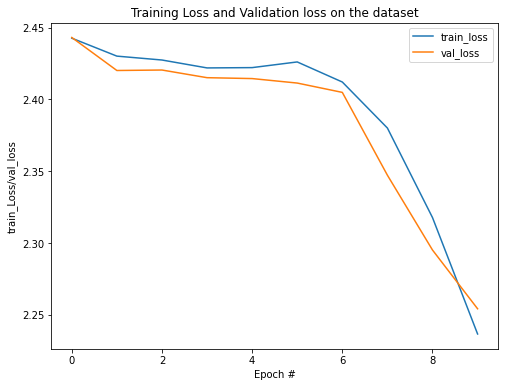

In [86]:
get_history_plot(10)

* There is a significant drop in training and validation accuracy as a result of greyscaling the images. 
* Furthermore, the model quickly starts to overtrain. **Note** as a test, I trained the model to 20 epochs. The training accuracy did improve, however the validation accuracy did not. The model was hugely overtrained after only 20 epochs.
* The drop in performance is perhaps expected. The plants are green while nothing in the background is green. Given that the background is quite noisy - randomly arranged pebbles with lots of edges - the green colour of the plants likely helps the model to classify where greyscale edges alone do not.

In [87]:
# Before moving on, let's delete the greyscale training data and greyscale images as we will not need them
del (X_train_gr, y_train_gr, X_val_gr, y_val_gr, X_test_gr, y_test_gr)
del (images_grey_blur5, images_grey_blur5_norm, images_grey)

## Test 3: Deeper Network Topology
As we have already found the optimum Gaussian Blurring filter to be 11x11, we do not need to do any data prep for this test. We can simply input the images with the 11x11 Gaussian Blur that we created earlier.

#### Test 3: Model Build
**Note that there were MANY tests that went into the following model**
* I tested the model adding groups of Conv2D, MaxPooling2D and Dropout. The dropout layers have been added to attempt to reduce overfitting the model.
* I have run the model many times and tried the following:
  - Increase the number of layers, I actually found that 3 with 128 kernals each gave me the highest training accuracy, 92% (validation accuracy was ~70%). I found that 4 gave the best validation accuracy.
  - Increase the number of kernals to 64 and 128 in each of the layers. This would increase the training accuracy but not the validation accuracy. After 20 epochs training accuracy was about 92% while the validation accuracy stayed at about 70%. I.e. the model becomes overfit as the complexity increases.
  - Increase the amount of dropout. This does have some effect on the overfitting. If I add a lot of dropout, the training accuracy drops and matches the validation accuracy at about 70% after 20 epochs.
  - Thinking that the dropout had eliminated my overfitting proplem, I attempted training over more epochs, hoping that would give a better result. It didn't. Depending on the model, overfitting begins at about epoch 5-10.
  - Adjusting the learning rate does have an effect on the training accuracy. However...
* No matter what I try to do with the model topology or paramterization, nothing will take the validation accuracy over about 70%.
* The model below gave the best validation accuracy with the least amount of overfitting.

In [88]:
# Initialising the CNN classifier
classifier = Sequential()

# Add a Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(64, (3, 3), input_shape = (128, 128,3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
#classifier.add(Dropout(0.5))

# Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.5))

# Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'valid'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.5))

# Flattening the layer before fully connected layers
classifier.add(Flatten())

# Adding a fully connected layer with 1024 neurons
classifier.add(Dense(units = 1024, activation = 'relu'))

# Adding dropout with probability 0.5
classifier.add(Dropout(0.5))

# Adding a fully connected layer with 128 neurons
classifier.add(Dense(units = 128, activation = 'relu'))

# The final output layer with 10 neurons to predict the categorical classifcation
classifier.add(Dense(units = 12, activation = 'softmax'))

In [89]:
classifier.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 128, 128, 64)      1792      
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 64, 64, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 32, 32, 64)        36928     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 64)       

#### Test 3: Model Evaluation

In [90]:
opt = tf.keras.optimizers.Adam(lr=0.001)
classifier.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [91]:
history = classifier.fit(X_train_b11,y_train_b11,
                         steps_per_epoch = int(1662/32),
                         epochs = 15,
                         validation_data = (X_val_b11,y_val_b11),
                         validation_steps = int(1663/32))

Epoch 1/15
51/51 [==============================] - 6s 90ms/step - loss: 2.4400 - accuracy: 0.1318 - val_loss: 2.4375 - val_accuracy: 0.1287
Epoch 2/15
51/51 [==============================] - 3s 68ms/step - loss: 2.3753 - accuracy: 0.1691 - val_loss: 2.1958 - val_accuracy: 0.2556
Epoch 3/15
51/51 [==============================] - 3s 68ms/step - loss: 1.8907 - accuracy: 0.3267 - val_loss: 1.7523 - val_accuracy: 0.3584
Epoch 4/15
51/51 [==============================] - 3s 68ms/step - loss: 1.6656 - accuracy: 0.4091 - val_loss: 1.5383 - val_accuracy: 0.4486
Epoch 5/15
51/51 [==============================] - 4s 69ms/step - loss: 1.5310 - accuracy: 0.4561 - val_loss: 1.4264 - val_accuracy: 0.5280
Epoch 6/15
51/51 [==============================] - 3s 68ms/step - loss: 1.3405 - accuracy: 0.5271 - val_loss: 1.2918 - val_accuracy: 0.5670
Epoch 7/15
51/51 [==============================] - 3s 68ms/step - loss: 1.2692 - accuracy: 0.5620 - val_loss: 1.1584 - val_accuracy: 0.6164
Epoch 8/15
51

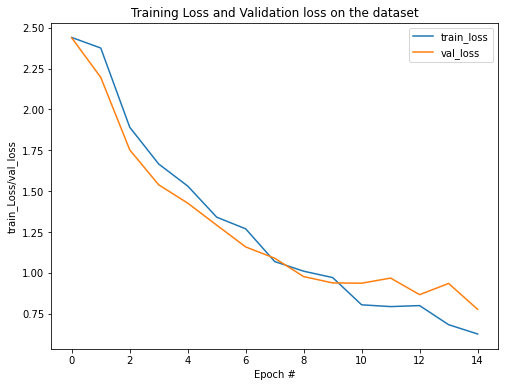

In [92]:
get_history_plot(15)

* The model above is not too badly overfit, however the validation accuracy does cap at about 70%. 
* As I stated before, NOTHING I tried, in terms of adjusting model topology, could bring the validation accuracy above ~70%.
* **The model topology is not the limiting factor, the lack of training data is.** We will attempt to address this in the next test.

## Test 4: Image Data Augmentation
* It is clear from the previous test that just adjusting topology and tuning parameters will not increase our validation accuracy.
* We will go back to manipulating the data that is used to training the model.
* CNNs work best when they have a lot of data to train with. Our training data set has only 1662 images, we can increase this by slightly altering the images that we already have to synthesize new images.
* In this test, we will use ImageDataGenerator to perform image data augmentation on our test images. This will effectively increase the population of our training images. 

#### Data Prep
* Here we will use ImageDataGenerator to synthesize new images from our existing images by makeing small changes to the images.
* It makes sense that a plant looks like a plant no matter if you flip the horizontal or vertical axis. So we will do both.
* We can also rotate the image of a plant and it still looks like a plant. I tested a number of angles and 90 degrees worked well.
* Making small shifts to the left/right or top/bottom will result in images that still look like plants so we will do that.
* Note that I tested changing the brightness but that did not have a positive result.

In [84]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True, rotation_range=90, width_shift_range=0.1,
                                   height_shift_range=0.1, fill_mode='nearest')  # brightness

#### Test 4: Model Build
* At this point it is probably better to say "Concept 4" rather than Test 4, as there were MANY tests that went into the following block of code.
* By artificially increasing the amount of training images, the overfitting problem experienced in the previous tests was dramatically reduced. This allowed a more complex CNN with less drop out.
* However, there did appear to be a cap to the validation accuracy at about 85%. Making the CNN more complex did not increase validation accuracy. It is likely that there is a limit due to the input data, that I will talk about below.
* The CNN in the code block below gave the best accuracy with little to no overfitting.



In [80]:
def create_final_model():
  # Initialising the CNN classifier
  classifier = Sequential()

  # Add a Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(64, (3, 3), input_shape = (128, 128,3), activation = 'relu', padding = 'same'))
  classifier.add(MaxPooling2D(pool_size = (2, 2)))

  # Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
  classifier.add(MaxPooling2D(pool_size = (2, 2)))
  classifier.add(Dropout(0.2))

  # Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
  classifier.add(MaxPooling2D(pool_size = (2, 2)))
  classifier.add(Dropout(0.2))

  # Add another Convolution layer with 128 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
  classifier.add(MaxPooling2D(pool_size = (2, 2)))
  classifier.add(Dropout(0.2))

  # Add another Convolution layer with 256 kernels of 3X3 shape with activation function ReLU
  classifier.add(Conv2D(256, (3, 3), activation = 'relu', padding = 'valid'))
  classifier.add(MaxPooling2D(pool_size = (2, 2)))
  classifier.add(Dropout(0.2))

  # Flattening the layer before fully connected layers
  classifier.add(Flatten())

  # Adding a fully connected layer with 1024 neurons
  classifier.add(Dense(units = 1024, activation = 'relu'))

  # Adding dropout with probability 0.5
  classifier.add(Dropout(0.2))

  # Adding a fully connected layer with 128 neurons
  classifier.add(Dense(units = 128, activation = 'relu'))

  # The final output layer with 10 neurons to predict the categorical classifcation
  classifier.add(Dense(units = 12, activation = 'softmax'))

  return classifier

In [79]:
classifier.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 128, 128, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 64, 64, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 30, 30, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 15, 15, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 7200)              0

#### Test 4: Model Evaluation

In [80]:
classifier = create_final_model()
opt = tf.keras.optimizers.Adam(lr=0.001)
classifier.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [81]:
history = classifier.fit(train_datagen.flow(X_train_b11,y_train_b11,
                                       batch_size=32, 
                                       seed=27,
                                       shuffle=False),
                    steps_per_epoch=int(1662/32),
                    epochs=50,
                    validation_data=(X_val_b11,y_val_b11), validation_steps = int(1663/32))

Epoch 1/50
51/51 [==============================] - 12s 206ms/step - loss: 2.4444 - accuracy: 0.1368 - val_loss: 2.4132 - val_accuracy: 0.1377
Epoch 2/50
51/51 [==============================] - 9s 172ms/step - loss: 2.3750 - accuracy: 0.1650 - val_loss: 2.2067 - val_accuracy: 0.2610
Epoch 3/50
51/51 [==============================] - 9s 169ms/step - loss: 2.0517 - accuracy: 0.2975 - val_loss: 1.7692 - val_accuracy: 0.3518
Epoch 4/50
51/51 [==============================] - 9s 173ms/step - loss: 1.7863 - accuracy: 0.3601 - val_loss: 1.6354 - val_accuracy: 0.3939
Epoch 5/50
51/51 [==============================] - 9s 168ms/step - loss: 1.5991 - accuracy: 0.4110 - val_loss: 1.4871 - val_accuracy: 0.4793
Epoch 6/50
51/51 [==============================] - 9s 170ms/step - loss: 1.5162 - accuracy: 0.4509 - val_loss: 1.5654 - val_accuracy: 0.4311
Epoch 7/50
51/51 [==============================] - 9s 169ms/step - loss: 1.3701 - accuracy: 0.4988 - val_loss: 1.3078 - val_accuracy: 0.5238
Epoch

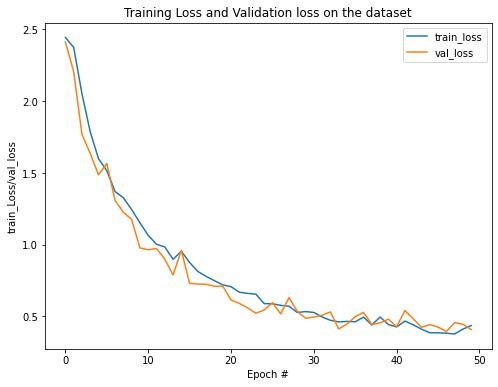

In [82]:
get_history_plot(50)

* Our validation accuracy has jumped from about 70-73% before the ImageDataGenerator to about 85% after using it. 
* In addition, the overfitting problem has been eliminated and the CNN could be trained for more epochs. Note that the accuracy starts to flatten between 40-50 epochs so there was little point in training further.

## Test 5: Add Early Stopping and Model Checkpoint
* This test will simply add early stopping and a mechanism to save the best model so that we can capture the best performance (with regards to validation accuracy).
* The reason that I did not add early stopping before is that I wanted to see where overfitting occured and how bad it was.

In [81]:
from keras.callbacks import EarlyStopping  #regularization method to prevent the overfitting
from keras.callbacks import ModelCheckpoint
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)
mc = ModelCheckpoint('best_model.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

#### Test 5: Model Build
Note that this is the same model as Test 4, the only difference will be that we add callbacks when we apply the .fit method.

In [82]:
classifier = create_final_model()
opt = tf.keras.optimizers.Adam(lr=0.001)
classifier.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])

#### Test 5 Model Evaluation

In [85]:
history = classifier.fit(train_datagen.flow(X_train_b11,y_train_b11,
                                       batch_size=32, 
                                       seed=27,
                                       shuffle=False),
                    steps_per_epoch=int(1662/32),
                    epochs=50,
                    validation_data=(X_val_b11,y_val_b11), validation_steps = int(1663/32),
                    callbacks=[es,mc],verbose=1)

Epoch 1/50
51/51 [==============================] - 12s 198ms/step - loss: 2.4442 - accuracy: 0.1362 - val_loss: 2.4117 - val_accuracy: 0.1377

Epoch 00001: val_accuracy improved from -inf to 0.13770, saving model to best_model.h5
Epoch 2/50
51/51 [==============================] - 9s 175ms/step - loss: 2.3486 - accuracy: 0.1785 - val_loss: 2.1158 - val_accuracy: 0.2598

Epoch 00002: val_accuracy improved from 0.13770 to 0.25977, saving model to best_model.h5
Epoch 3/50
51/51 [==============================] - 8s 166ms/step - loss: 1.9719 - accuracy: 0.3031 - val_loss: 1.7532 - val_accuracy: 0.3692

Epoch 00003: val_accuracy improved from 0.25977 to 0.36921, saving model to best_model.h5
Epoch 4/50
51/51 [==============================] - 9s 167ms/step - loss: 1.7794 - accuracy: 0.3613 - val_loss: 1.6092 - val_accuracy: 0.4089

Epoch 00004: val_accuracy improved from 0.36921 to 0.40890, saving model to best_model.h5
Epoch 5/50
51/51 [==============================] - 9s 167ms/step - lo

* In this case the final epoch just happened to be the best one, so we will not need to go to the trouble of loading our best model from the saved file.
* We can see that the validation accuracy is 85%. We will evaluate the model performance on the test data in the following section.

# Model Performance Evaluation
*-Evaluate the model on different performance metrics and comment on the performance and scope of improvement*

#### Accuracy on Test Data
Let's first evaluate the CNN accuracy on the test data and talk about the scope of improvement.

In [86]:
classifier.evaluate(X_test,y_test)

45/45 [==============================] - 1s 27ms/step - loss: 0.3909 - accuracy: 0.8625


[0.39088529348373413, 0.8624561429023743]

* We can see that the test accuracy is 86.25% This is much better than our original model which had a test accuracy of 67.64%.
* We have improved our model accuracy by appoximately 20%
* In our case, the biggest improvements came from changing the input data:
  - We saw a slight increase in accuracy after changing out Gaussian Blurring filter from 5x5 to 11x11, however this was only a few percent from validation accuracy ~68% to ~70%
  - Increasing the model complexity did provide a little boost from validation accuracy of ~70% to 70-74% (depending on the stochastic nature of the model runs.
  - The biggest improvement in accuracy came from increasing the amount of training data using ImageDataGenerator, which took our validation accuracy from 70-74% up to 85%.

#### Confusion Matrix

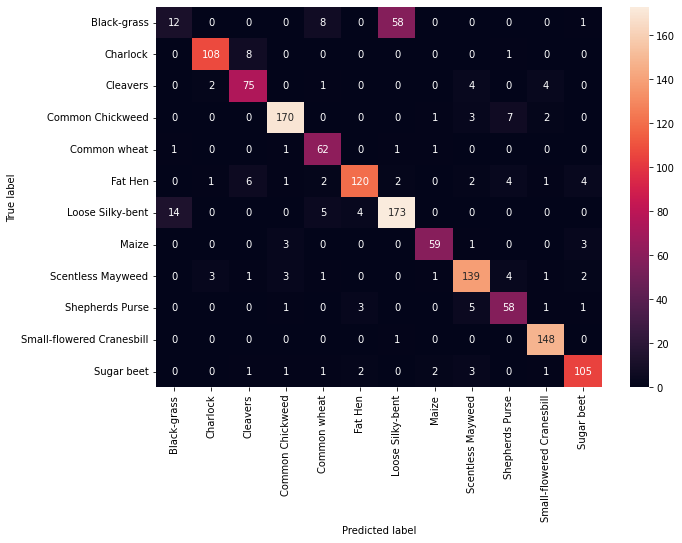

In [89]:
get_cm(X_test,y_test)

* We can see that, for the most part the CNN has done a very good job of classifying the correct seedling.
* The main exception is Black-grass, which has been incorrectly classified as Loose Silky-bent much more than it has been correctly classified. Here is why I belive this is so:
  - Black-grass and Loose Silky-bent look very similar.
  - There is many more Loose Silky-bent images in the data than Black-grass 13.77% compared to 5.54%
  - When the CNN is attempting to 'decide' if an image is Black-grass or Loose Silky-bent and it is 'not sure', the best option is to always choose the Loose Silk-bent as there are 2.5x more Loose Silky-bent images in the data compared to Black-grass.
* There is very little that we can do in terms of CNN architecture that would improve this - we would need better images of Black-grass and more of them.
* **If we remove Black-grass and Loose Silky-bent from the calculation the accuracy increases to 90.78%**. So the misclassification here is having a big effect on our average accuracy score.

#### Classification Report / Performance Metrics

In [96]:
# Below is a list of the seedlings in alphabetical order, the same order as the encoding, we wil use this to label the classification report
labels_array = ('Black-grass','Charlock','Cleavers','Common Chickweed','Common wheat','Fat Hen','Loose Silky-bent',
                'Maize','Scentless Mayweed','Shepherds Purse','Small-flowered Cranesbill','Sugar beet')
y_pred = classifier.predict(X_test) # get the predicted labels from the final CNN
print("=== Classification Report ===")
print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1), target_names= labels_array))

=== Classification Report ===
                           precision    recall  f1-score   support

              Black-grass       0.44      0.15      0.23        79
                 Charlock       0.95      0.92      0.94       117
                 Cleavers       0.82      0.87      0.85        86
         Common Chickweed       0.94      0.93      0.94       183
             Common wheat       0.78      0.94      0.85        66
                  Fat Hen       0.93      0.84      0.88       143
         Loose Silky-bent       0.74      0.88      0.80       196
                    Maize       0.92      0.89      0.91        66
        Scentless Mayweed       0.89      0.90      0.89       155
          Shepherds Purse       0.78      0.84      0.81        69
Small-flowered Cranesbill       0.94      0.99      0.96       149
               Sugar beet       0.91      0.91      0.91       116

                 accuracy                           0.86      1425
                macro avg     

* The table above shows the various performance metrics of the CNN (precision, recall, f1-score) for each seedling type.
* We can see that each seedling type has a similar precision, recall and f1-score. The exceptions are:
  - Black-grass: The precision is much higher than the recall because there were not a lot of false positives (the CNN did not predict Black-grass often and there is not a lot of Black-grass), this inflates the precision score.
  - Common wheat: as we saw in our EDA, this seedling looks very similar to Black-grass and Loose Silky-bent. Precision is lower as there were a number of false positives when Common wheat was predicted when the true seedling was Black-grass or Loose Silky-bent. Common wheat was the equal lowest seedling class in the data. This likely also contributed to the poorer performance of the CNN with this class.
  - Loose Silky-bent: as discussed, the CNN has predicted a lot of Black-grass as Loose Silky-bent, this drops the precision and f1-score.
* The classification report reflects our expectations from the EDA. We saw that the seedlings with a very homogeneous average image were predicted worse than those with a non-homogeneous average. 
* We also saw that seedling classes that were under-represented in the data had worse metrics than those with better representation. Unfortunately for Black-grass and Common wheat, both of these seedlings look like Loose Silky-bent AND are some of the lowest populated classes in the data.

# Conclusion and key takeaways
*- Final conclusion about the analysis*

* Many tests were run over the course of completing this project and many CNN topologies were attempted. 
* What I found was that the validation accuracy would bump up against a hard limit, where no matter what I did to change the CNN topology, or other hyperparameters like learning rate, the validation accuracy would not improve. 
* I believe that this is because the model accuracy was ultimately limited by the input data. CNNs, and ANNs in general, work best when there is a large dataset on which to train the model. Our training dataset in this case was not very large. Indeed, the biggest increase in accuracy was obtained by using Image Data Augmentation to increase the amount of training images.
* However, Image Data Augmentation can only modify the existing images, and the final limiting factor controlling the model performance was the fact that the seedling classes were unbalanced. We saw the worst performance in the seedlings with the lowest representation in the dataset, i.e. Black-grass and Common wheat. Black-grass looked very similar to Loose Silky-bent and was often misclassified as Loose Silky-bent, this in turn reduced the accuracy and precision metrics of Loose Silky-bent.
* I believe that the model accuracy is at (or close to) the maximum possible given the input data. We can prove that to ourselves by running a much more complicated model. We will see that this does not achieve a better accuracy than we obtained with our final model. The extra complexity in this case is just a waste of resources.


#### An overly complicated model to prove a point.
Below is a model with double the number of convlution layers and an extra deep layer for even more over-kill. We will see that this model does no better than our simpler final model because, the limit to model performace (at this point) is limited the input data and not the model topography.

In [ ]:
# Initialising the CNN classifier
classifier = Sequential()

# Add a Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(64, (3, 3), input_shape = (128, 128,3), activation = 'relu', padding = 'same'))
classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

# Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(Conv2D(64, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.2))

# Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.2))

# Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.2))

# Add another Convolution layer with 64 kernels of 3X3 shape with activation function ReLU
classifier.add(Conv2D(256, (3, 3), activation = 'relu', padding = 'valid'))
classifier.add(Conv2D(128, (3, 3), activation = 'relu', padding = 'same'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.2))

# Flattening the layer before fully connected layers
classifier.add(Flatten())

# Adding a fully connected layer with 1024 neurons
classifier.add(Dense(units = 1024, activation = 'relu'))
classifier.add(Dense(units = 512, activation = 'relu'))

# Adding dropout with probability 0.5
classifier.add(Dropout(0.2))

# Adding a fully connected layer with 128 neurons
classifier.add(Dense(units = 128, activation = 'relu'))

# The final output layer with 10 neurons to predict the categorical classifcation
classifier.add(Dense(units = 12, activation = 'softmax'))


In [77]:
opt = tf.keras.optimizers.Adam(lr=0.001)
classifier.compile(optimizer = opt, loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [81]:
history = classifier.fit(train_datagen.flow(X_train_b11,y_train_b11,
                                       batch_size=32, 
                                       seed=27,
                                       shuffle=False),
                    steps_per_epoch=int(1662/32),
                    epochs=50,
                    validation_data=(X_val_b11,y_val_b11), validation_steps = int(1663/32),
                    callbacks=[es],verbose=1)

Epoch 1/50
51/51 [==============================] - 54s 1s/step - loss: 1.3699 - accuracy: 0.5252 - val_loss: 0.9853 - val_accuracy: 0.6771
Epoch 2/50
51/51 [==============================] - 52s 1s/step - loss: 1.2194 - accuracy: 0.5791 - val_loss: 0.9864 - val_accuracy: 0.6759
Epoch 3/50
51/51 [==============================] - 52s 1s/step - loss: 1.1592 - accuracy: 0.5810 - val_loss: 0.8816 - val_accuracy: 0.7011
Epoch 4/50
51/51 [==============================] - 52s 1s/step - loss: 1.1286 - accuracy: 0.6135 - val_loss: 0.8718 - val_accuracy: 0.7162
Epoch 5/50
51/51 [==============================] - 52s 1s/step - loss: 1.0833 - accuracy: 0.6098 - val_loss: 0.8903 - val_accuracy: 0.6993
Epoch 6/50
51/51 [==============================] - 53s 1s/step - loss: 1.0790 - accuracy: 0.6160 - val_loss: 0.8725 - val_accuracy: 0.6981
Epoch 7/50
51/51 [==============================] - 56s 1s/step - loss: 1.0336 - accuracy: 0.6319 - val_loss: 0.8241 - val_accuracy: 0.7210
Epoch 8/50
51/51 [==

We can see the final validation accuracy was about 80% - worse than our simpler model. Again, this indicates that the input data - and not model complexity - is the limiting factor at this point. I believe that the model accuracy is as good as I can get it, at ~85% and so this is where I will finish the project.  

Thank you for your time in reading this far!  
Benjamin Hardy September 22nd 2021